# Predicting Steel Plate Faults

![](steel-plate-fault.jpg)

The goal of this notebook is to correctly classify Steel Plates Faults.

The dataset includes 1941 observations, and 27 features. The data is already labeled.

## Data Preparation

### Import Libraries

In [1]:
# Ignore Warning
import warnings
warnings.filterwarnings("ignore")

In [2]:
# For data wrangling 
import pandas as pd

# For Scaling data values
from sklearn.preprocessing import StandardScaler

# for advanced statistical analysis
from scipy.stats import skew

# For visualization
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

pd.options.display.max_rows = None
pd.options.display.max_columns = None

In [3]:
# Read the data frame
df = pd.read_csv('steel_plates_fault.csv', delimiter=',')
df.head()

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,Length_of_Conveyer,TypeOfSteel_A300,TypeOfSteel_A400,Steel_Plate_Thickness,Edges_Index,Empty_Index,Square_Index,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas,Fault
0,42,50,270900,270944,267,17,44,24220,76,108,1687,1,0,80,0.0498,0.2415,0.1818,0.0047,0.4706,1.0000,1.0,2.4265,0.9031,1.6435,0.8182,-0.2913,0.5822,0
1,645,651,2538079,2538108,108,10,30,11397,84,123,1687,1,0,80,0.7647,0.3793,0.2069,0.0036,0.6000,0.9667,1.0,2.0334,0.7782,1.4624,0.7931,-0.1756,0.2984,0
2,853,860,369370,369415,176,13,45,18996,99,126,1353,0,1,290,0.7287,0.4413,0.1556,0.0052,0.5385,1.0000,1.0,2.2455,0.8451,1.6532,0.8444,-0.1568,0.5212,0
3,1289,1306,498078,498335,2409,60,260,246930,37,126,1353,0,1,185,0.0695,0.4486,0.0662,0.0126,0.2833,0.9885,1.0,3.3818,1.2305,2.4099,0.9338,-0.1992,1.0000,0
4,430,441,100250,100337,630,20,87,62357,64,127,1387,0,1,40,0.6200,0.3417,0.1264,0.0079,0.5500,1.0000,1.0,2.7993,1.0414,1.9395,0.8736,-0.2267,0.9874,0


In [4]:
print(f"Shape of the Data Set: {df.shape}")

Shape of the Data Set: (1768, 28)


At the moment the data is consist of 1941 observations and 32 columns from which 7 are the encoded fault types, we can also look at the descriptive statistics on the dataset:

In [5]:
# Check columns list and missing values
df.isnull().sum()

X_Minimum                0
X_Maximum                0
Y_Minimum                0
Y_Maximum                0
Pixels_Areas             0
X_Perimeter              0
Y_Perimeter              0
Sum_of_Luminosity        0
Minimum_of_Luminosity    0
Maximum_of_Luminosity    0
Length_of_Conveyer       0
TypeOfSteel_A300         0
TypeOfSteel_A400         0
Steel_Plate_Thickness    0
Edges_Index              0
Empty_Index              0
Square_Index             0
Outside_X_Index          0
Edges_X_Index            0
Edges_Y_Index            0
Outside_Global_Index     0
LogOfAreas               0
Log_X_Index              0
Log_Y_Index              0
Orientation_Index        0
Luminosity_Index         0
SigmoidOfAreas           0
Fault                    0
dtype: int64

We have no missing values!

In [6]:
df.describe()

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,Length_of_Conveyer,TypeOfSteel_A300,TypeOfSteel_A400,Steel_Plate_Thickness,Edges_Index,Empty_Index,Square_Index,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas,Fault
count,1768.000000,1768.000000,1.768000e+03,1.768000e+03,1768.000000,1768.000000,1768.000000,1.768000e+03,1768.000000,1768.00000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.00000,1768.000000,1768.000000,1768.00000,1768.000000,1768.000000
mean,571.486991,617.891403,1.633688e+06,1.633742e+06,1884.888575,111.542986,83.396493,2.053052e+05,84.940611,130.28733,1459.607466,0.395928,0.604072,78.868778,0.334646,0.411844,0.571866,0.033026,0.612557,0.815822,0.578620,2.486338,1.33169,1.399421,0.084252,-0.12948,0.582913,0.347851
std,518.135837,495.295022,1.778833e+06,1.778846e+06,5290.741984,310.469104,445.507869,5.204571e+05,32.186486,18.52721,144.899480,0.489187,0.489187,55.513355,0.300035,0.137308,0.271507,0.059228,0.245383,0.233626,0.481445,0.787011,0.47970,0.456309,0.500017,0.15040,0.340131,0.476423
min,0.000000,4.000000,6.712000e+03,6.724000e+03,2.000000,2.000000,1.000000,2.500000e+02,0.000000,37.00000,1227.000000,0.000000,0.000000,40.000000,0.000000,0.000000,0.008300,0.001500,0.014400,0.048400,0.000000,0.301000,0.30100,0.000000,-0.991000,-0.99890,0.119000,0.000000
25%,52.750000,192.000000,4.544372e+05,4.544752e+05,83.000000,15.000000,13.000000,9.519500e+03,64.000000,124.00000,1358.000000,0.000000,0.000000,40.000000,0.060400,0.313025,0.361525,0.006600,0.409100,0.599575,0.000000,1.919100,1.00000,1.079200,-0.316400,-0.19500,0.246300,0.000000
50%,447.500000,481.000000,1.160381e+06,1.160390e+06,171.500000,26.500000,25.000000,1.907200e+04,90.000000,127.00000,1364.000000,0.000000,1.000000,70.000000,0.230750,0.408600,0.560000,0.010100,0.638200,0.952400,1.000000,2.234250,1.17610,1.322200,0.097300,-0.13125,0.500400,0.000000
75%,1051.000000,1071.000000,2.175514e+06,2.175525e+06,791.000000,81.250000,80.250000,7.969575e+04,106.000000,140.00000,1650.000000,1.000000,1.000000,80.000000,0.582550,0.500900,0.818200,0.022700,0.800000,1.000000,1.000000,2.898150,1.50510,1.732400,0.500000,-0.06510,0.999800,1.000000
max,1705.000000,1713.000000,1.298766e+07,1.298769e+07,152655.000000,10449.000000,18152.000000,1.159141e+07,203.000000,253.00000,1794.000000,1.000000,1.000000,300.000000,0.995200,0.943900,1.000000,0.875900,1.000000,1.000000,1.000000,5.183700,3.07410,4.258700,0.991700,0.64210,1.000000,1.000000


To be able to use the data, I will drop the one-hot encoding of the types and add a single __Target__ column with the fault type names:

Let's create a copy of the data that remains unchanged with the pre-procecssing:

In [7]:
origina_data = df.copy()

Let's take a look at the classes of faults:

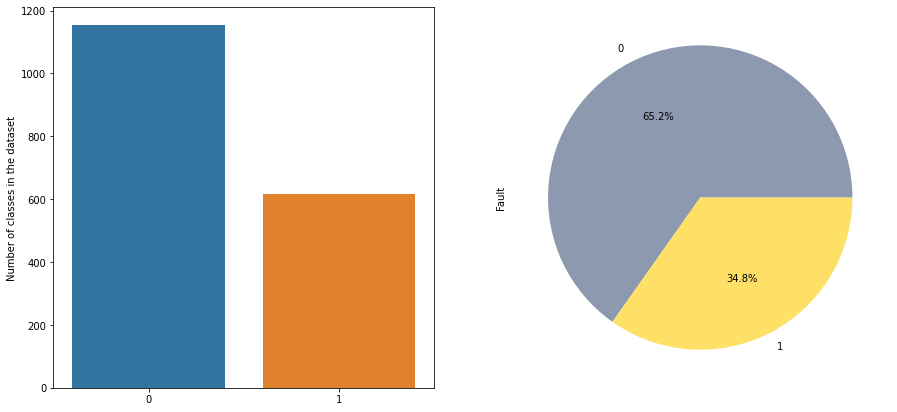

In [8]:
target_counts= df['Fault'].value_counts()

fig, ax = plt.subplots(1, 2, figsize=(15,7))
target_counts_barplot = sns.barplot(x=target_counts.index, y=target_counts.values, ax=ax[0])
target_counts_barplot.set_ylabel('Number of classes in the dataset')

colors = ['#8d99ae', '#ffe066', '#f77f00', '#348aa7', '#bce784', '#ffcc99', '#f25f5c']
target_counts.plot.pie(autopct="%1.1f%%", ax=ax[1], colors=colors);


It can be seen that there are observations (34.8%) that are labeled as __Faults__ which is less and __Not_Faults__ have very high number of observations. However, this might cause an issue as classification methods might not perform well in recognizing the less populated faults. Therefore, a balanced sampling method might provide some improvements in the performance of the classification method. However, it should be studied and tested to give a final opinion.

In the following, I would like to look at the pairplot to take a look at the distribution of the features. The pairplot will be very crowded as there are many features to be examined. However, with zooming in it is possible to get some ideas:

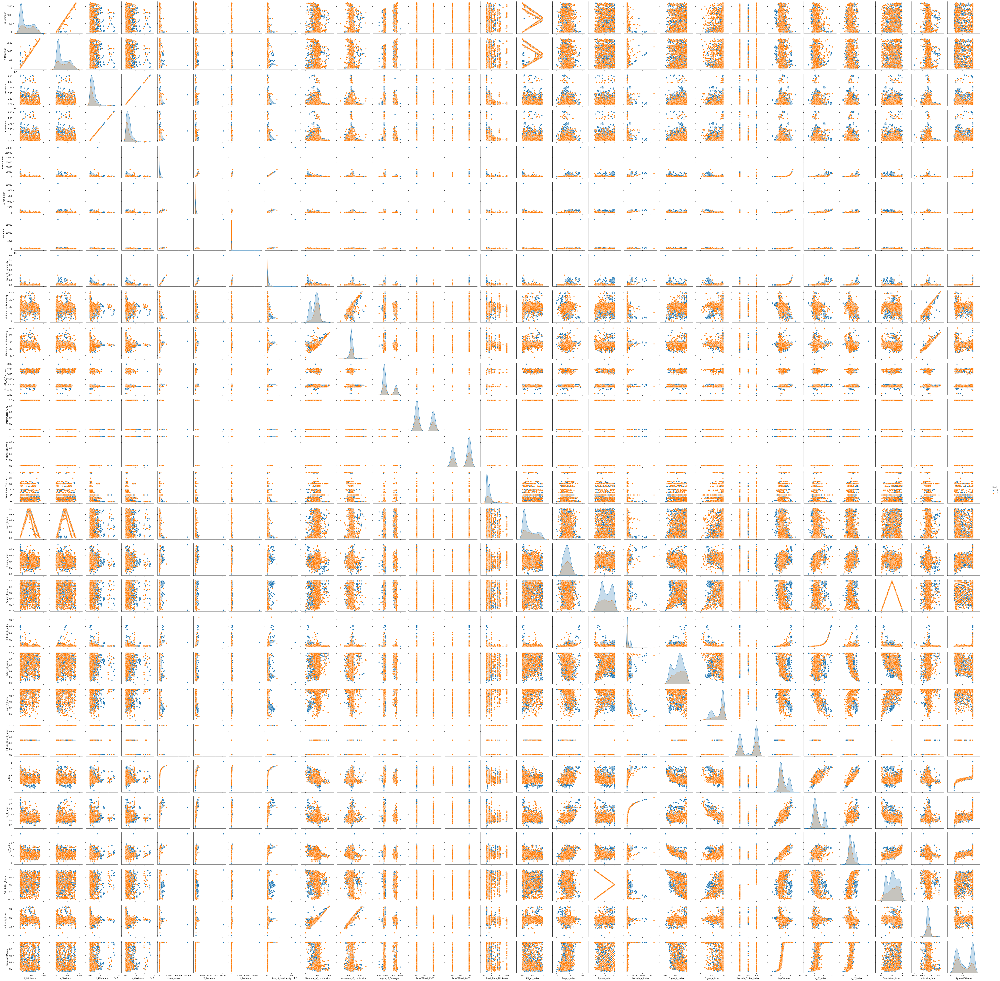

In [9]:
sns.pairplot(df, hue='Fault');

From the pair plot I can see that the _TypeOfSteel_A300_, _TypeOfSteel_A400_ and _Outside_Global_Index_ are actually categorical featrues:

In [10]:
df['TypeOfSteel_A300'] = df['TypeOfSteel_A300'].astype('category',copy=False)
df['TypeOfSteel_A400'] = df['TypeOfSteel_A400'].astype('category',copy=False)
df['Outside_Global_Index'] = df['Outside_Global_Index'].astype('category',copy=False)

Also, I could notice some correlations between some of the features. To investigate it more deeply I will use Peason's Correlation of the numerical features to see if the features are mutually independent. I use a heatmap to visualize the correlation:

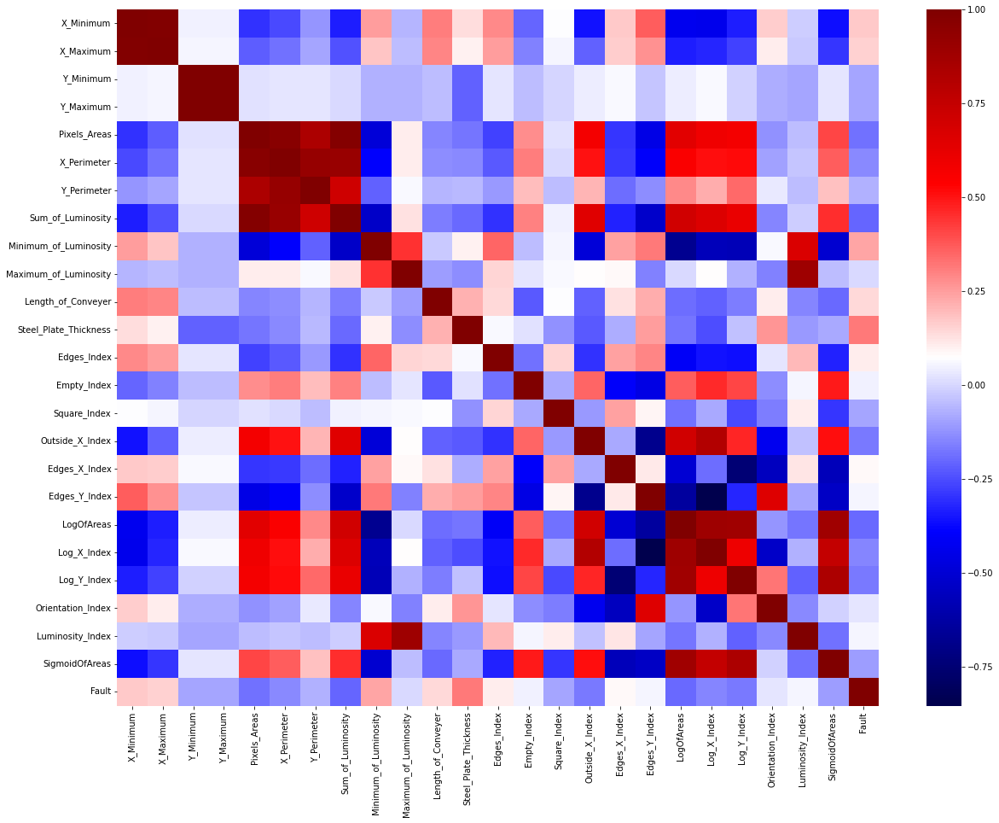

In [11]:
plt.figure(figsize=(20,15))
sns.heatmap(df.corr(), cmap='seismic');

From the heatmap, it can be seen that there are some features that are highly correlated (shown in dark red for positive correlation and dark blue for negative correlation), with each other and cannot be considered as indipendent variables that we need for modeling. The features with white or very light colors however, can be condidered as indipendent. Let's examine some of the examples of correlated features below:

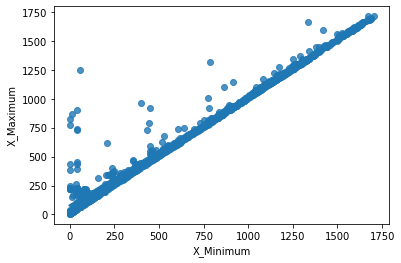

In [12]:
sns.regplot(x='X_Minimum', y='X_Maximum', data=df, scatter=True);

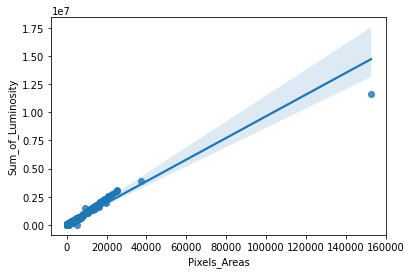

In [13]:
sns.regplot(x='Pixels_Areas', y='Sum_of_Luminosity', data=df, scatter=True);

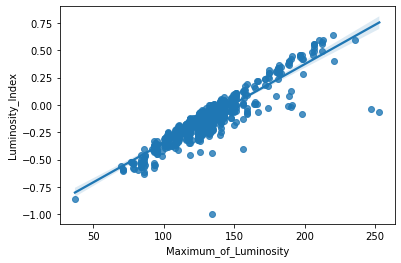

In [14]:
sns.regplot(x='Maximum_of_Luminosity', y='Luminosity_Index', data=df, scatter=True);

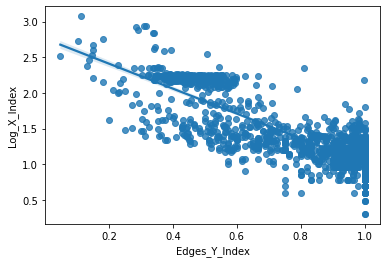

In [15]:
sns.regplot(x='Edges_Y_Index', y='Log_X_Index', data=df, scatter=True);

The linear relationship between the two features shows their correlation.

## Feature Skewness

When we talk about normality what we mean is that the data should look like a normal distribution. This is important because several statistic tests rely on this (e.g. t-statistics).

If the dataset is skewed, then the Machine Learning model wouldn’t be able to do a good job on predictions. To resolve the issue of the skewed features we can apply the log transform of the same data, or to use the Box-Cox Transformation. Let's see how skewed are our numerical features:

In [16]:
numeric_features = df.dtypes[df.dtypes != "object"].index

skewed_features = df[numeric_features].apply(lambda x: skew(x)).sort_values(ascending=False)

skewed_features_df = pd.DataFrame(skewed_features, columns={'Skew'})
skewed_features_df.head(10)

,Skew
Y_Perimeter,37.811406
X_Perimeter,21.534515
Pixels_Areas,14.327237
Sum_of_Luminosity,7.955592
Outside_X_Index,5.334490
Y_Minimum,2.847491
Y_Maximum,2.847442
Steel_Plate_Thickness,2.186408
Maximum_of_Luminosity,1.189603
Log_X_Index,1.015882


In [17]:
skewed_features_df.tail(10)

,Skew
TypeOfSteel_A300,0.425611
Empty_Index,0.307294
SigmoidOfAreas,0.136639
Square_Index,-0.064008
Minimum_of_Luminosity,-0.084130
Orientation_Index,-0.161287
Edges_X_Index,-0.239682
Outside_Global_Index,-0.318117
TypeOfSteel_A400,-0.425611
Edges_Y_Index,-0.944541


I remove our categorical features from the list before applying the Box-Cox transformation:

In [18]:
skewed_features_df.drop(['TypeOfSteel_A400', 'TypeOfSteel_A300', 'Outside_Global_Index'], inplace=True)

From what we can see, there are many features that are skewed, therefore, a method to resolve this issue might provide better performances in many of the models that would be applied on this dataset. Let's see one of the skewed features and compare the results after applying the Box-Cox Transformation:

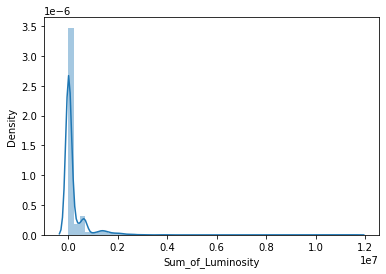

In [19]:
sns.distplot(df['Sum_of_Luminosity']);

Now I apply the Box-Cox transformation that is available in scipy special module:

In [20]:
skewed_features_df = skewed_features_df[abs(skewed_features_df) > 0.75]

from scipy.special import boxcox1p
lam = 0.15
cols = skewed_features_df.index

for c in cols:
    df[c] = boxcox1p(df[c], lam)

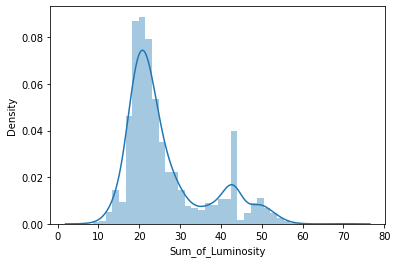

In [21]:
sns.distplot(df['Sum_of_Luminosity']);

It can be seen that the sample feature that we examined is now very close to a normal distribution.

## Scaling the Features

In many models the features need to be scaled for the model to perform well. Features with high values may effect the performance of many models. I will first separate the features and the target from our dataset and then apply the standard scaler on the features:

In [22]:
features = df.drop('Fault', axis=1)
target = df['Fault']

scaler = StandardScaler()
features_scaled = pd.DataFrame(scaler.fit_transform(features), columns=features.columns)

## Model fitting and selection

In [23]:
import evalml
from evalml.automl import AutoMLSearch
problem_type = 'binary'

X_train, X_test, y_train, y_test = evalml.preprocessing.split_data(features_scaled, target, problem_type = problem_type, test_size=.2)

# perform a search across multiple pipelines and hyperparameters
automl = AutoMLSearch(X_train, y_train, problem_type=problem_type)
automl.search()

	High coefficient of variation (cv >= 0.5) within cross validation scores.
	Decision Tree Classifier w/ Label Encoder + Imputer may not perform as estimated on unseen data.


In [24]:
# the best pipeline is already refitted on the entire training data
best_pipeline = automl.best_pipeline
best_pipeline.predict(X_test)

464     0.000000
1641    0.730463
1169    0.730463
771     0.000000
598     0.000000
1694    0.730463
1643    0.730463
1047    0.000000
1756    0.730463
1081    0.730463
697     0.000000
1177    0.730463
616     0.000000
1697    0.730463
98      0.730463
1584    0.730463
1511    0.730463
1575    0.730463
1267    0.730463
1381    0.730463
1462    0.000000
277     0.000000
595     0.000000
1329    0.000000
599     0.000000
1535    0.730463
1730    0.730463
925     0.730463
694     0.000000
228     0.000000
1727    0.730463
1256    0.730463
1489    0.730463
1722    0.730463
1714    0.000000
734     0.000000
1663    0.730463
370     0.000000
806     0.000000
594     0.000000
899     0.000000
1203    0.730463
876     0.730463
1493    0.730463
541     0.000000
244     0.730463
555     0.000000
201     0.000000
696     0.000000
1601    0.000000
1492    0.000000
1435    0.730463
1110    0.000000
749     0.000000
1284    0.730463
1269    0.730463
32      0.000000
87      0.730463
1193    0.7304

In [25]:
automl.rankings

,id,pipeline_name,search_order,mean_cv_score,standard_deviation_cv_score,validation_score,percent_better_than_baseline,high_variance_cv,parameters
0,3,XGBoost Classifier w/ Label Encoder + Imputer,3,0.452381,0.012689,0.461112,96.235729,False,{'Imputer': {'categorical_impute_strategy': 'm...
1,6,Random Forest Classifier w/ Label Encoder + Im...,6,0.476995,0.005428,0.472929,96.030915,False,{'Imputer': {'categorical_impute_strategy': 'm...
2,4,LightGBM Classifier w/ Label Encoder + Imputer,4,0.488107,0.019279,0.492266,95.938452,False,{'Imputer': {'categorical_impute_strategy': 'm...
3,8,Extra Trees Classifier w/ Label Encoder + Imputer,8,0.490725,0.008230,0.488991,95.916665,False,{'Imputer': {'categorical_impute_strategy': 'm...
4,2,Logistic Regression Classifier w/ Label Encode...,2,0.544053,0.022228,0.537514,95.472918,False,{'Imputer': {'categorical_impute_strategy': 'm...
5,1,Elastic Net Classifier w/ Label Encoder + Impu...,1,0.547811,0.021070,0.543673,95.441648,False,{'Imputer': {'categorical_impute_strategy': 'm...
6,5,CatBoost Classifier w/ Label Encoder + Imputer,5,0.602947,0.002189,0.602024,94.982860,False,{'Imputer': {'categorical_impute_strategy': 'm...
7,7,Decision Tree Classifier w/ Label Encoder + Im...,7,1.865438,0.259089,2.091328,84.477644,True,{'Imputer': {'categorical_impute_strategy': 'm...
8,0,Mode Baseline Binary Classification Pipeline,0,12.017748,0.014710,12.000761,0.000000,False,{'Baseline Classifier': {'strategy': 'mode'}}


In [26]:
automl.describe_pipeline(automl.rankings.iloc[0]["id"])


*************************************************
* XGBoost Classifier w/ Label Encoder + Imputer *
*************************************************

Problem Type: binary
Model Family: XGBoost

Pipeline Steps
1. Label Encoder
2. Imputer
	 * categorical_impute_strategy : most_frequent
	 * numeric_impute_strategy : mean
	 * categorical_fill_value : None
	 * numeric_fill_value : None
3. XGBoost Classifier
	 * eta : 0.1
	 * max_depth : 6
	 * min_child_weight : 1
	 * n_estimators : 100
	 * n_jobs : -1
	 * eval_metric : logloss

Training
Training for binary problems.
Total training time (including CV): 3.3 seconds

Cross Validation
----------------
             Log Loss Binary  MCC Binary  Gini   AUC  Precision    F1  Balanced Accuracy Binary  Accuracy Binary # Training # Validation
0                      0.461       0.529 0.701 0.850      0.680 0.696                     0.767            0.784        942          472
1                      0.458       0.496 0.711 0.856      0.669 0.673    

In [27]:
scores = best_pipeline.score(X_test, y_test,  objectives=["auc"])
print(scores['AUC'])

0.8817266744096012


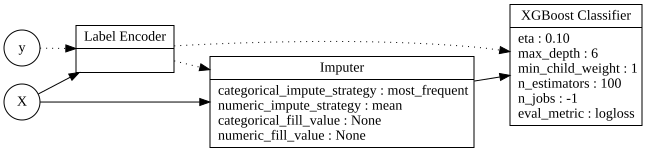

In [28]:
best_pipeline.graph()